<a href="https://colab.research.google.com/github/Alicdc2022/Practicas_RedesNeuronales_AlineCamposGalleguillos/blob/main/objet_detect_aline_campos_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introducción

Codigo para aprender a detectar objetos con redes neuronales

## 1. Generando un sliding window

1.1 Instalar Opencv Phyton  4.1.2.30

In [1]:
!pip install opencv-python-headless==4.1.2.30
!pip install --upgrade pip

ERROR: Could not find a version that satisfies the requirement opencv-python-headless==4.1.2.30 (from versions: 3.4.10.37, 3.4.11.39, 3.4.11.41, 3.4.11.43, 3.4.11.45, 3.4.13.47, 3.4.15.55, 3.4.16.59, 3.4.17.61, 3.4.17.63, 3.4.18.65, 4.3.0.38, 4.4.0.40, 4.4.0.42, 4.4.0.44, 4.4.0.46, 4.5.1.48, 4.5.3.56, 4.5.4.58, 4.5.4.60, 4.5.5.62, 4.5.5.64, 4.6.0.66, 4.7.0.68, 4.7.0.72, 4.8.0.74, 4.8.0.76)
ERROR: No matching distribution found for opencv-python-headless==4.1.2.30
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 8.2 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2


## 1.2 Impotar librerias

In [2]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

## 1.3 Cargar imagen a colab

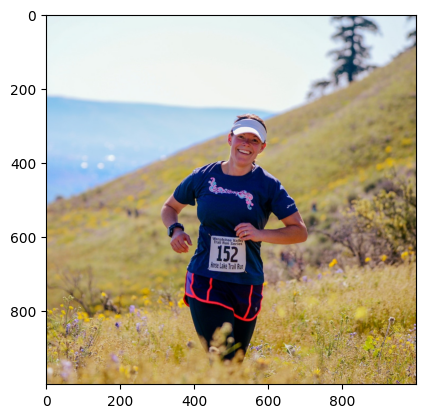

In [3]:
np_image = cv2.imread('pexels-frank-cone-2330502-cropped.jpg')
np_image = cv2.cvtColor(np_image, cv2.COLOR_BGR2RGB)
np_image = cv2.resize(np_image, dsize=(1000, 1000))
plt.imshow(np_image)

## 1.4 Definir Sliding window

In [4]:
def sliding_window(image, step, ws):
  for y in range(0, image.shape[0]-ws[1]+1, step):
    for x in range(0, image.shape[1]-ws[0]+1, step):
      yield (x, y, image[y:y + ws[1], x:x +ws[0]])

In [5]:
windows = sliding_window(np_image, 200, (200, 200))

In [6]:
os.makedirs('sliding_window')

## 1.5 Recorrer la img

<ipython-input-7-000bf4b61af1>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))


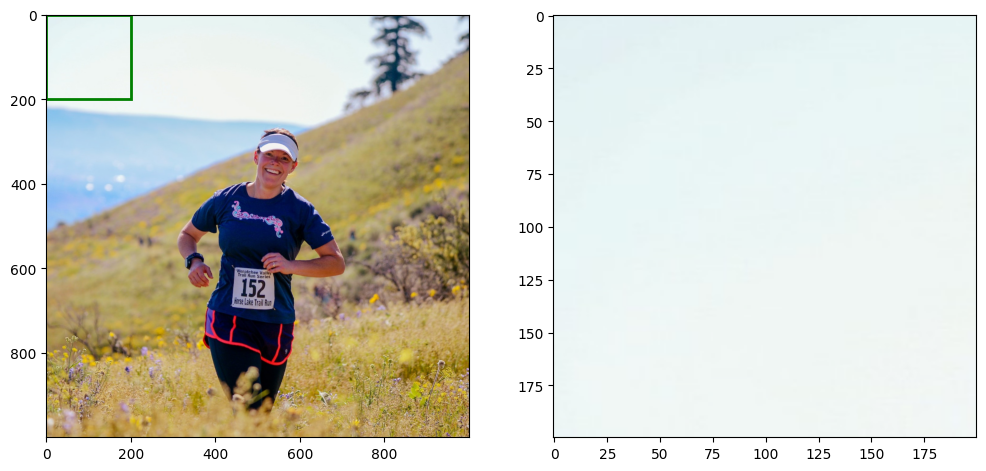

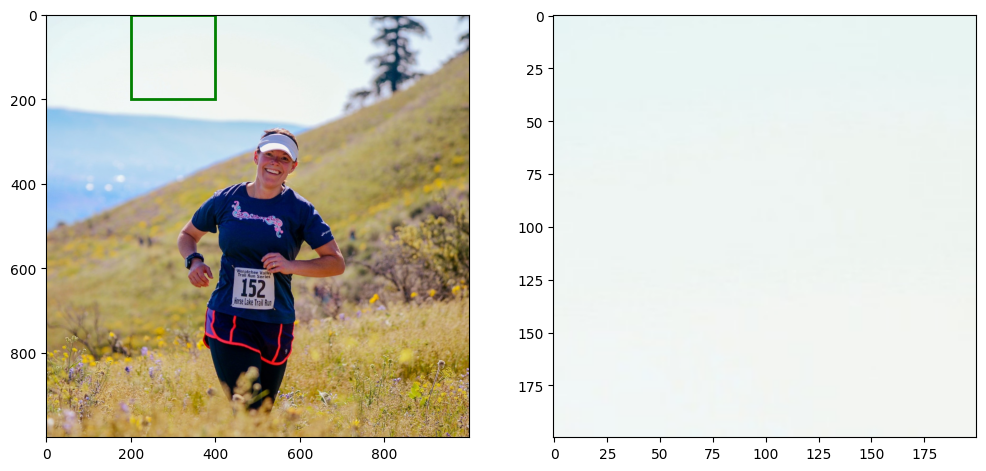

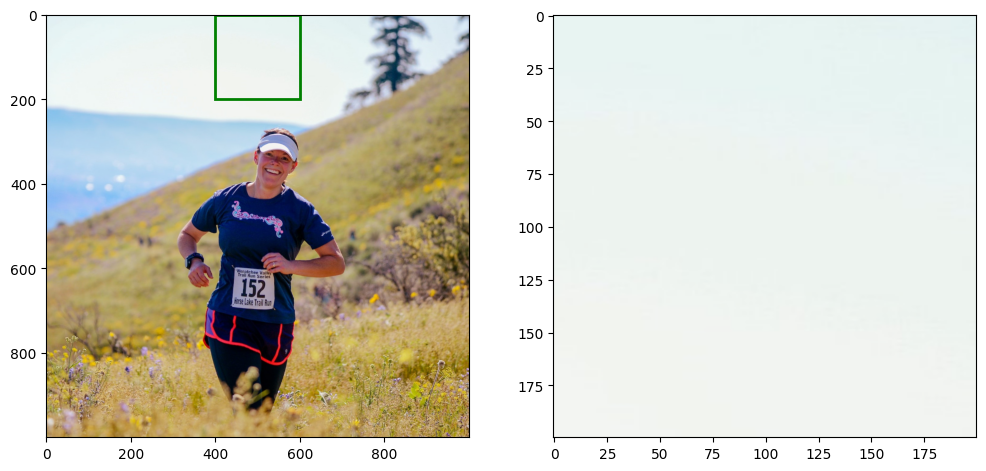

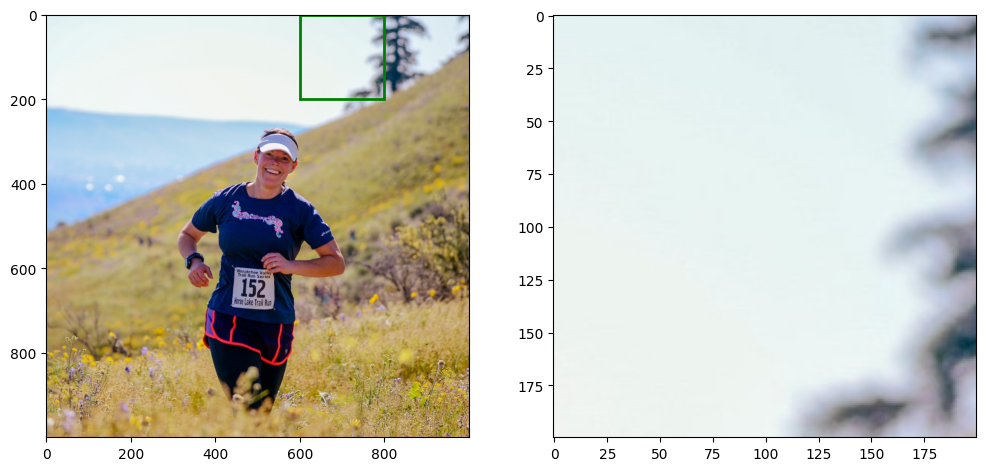

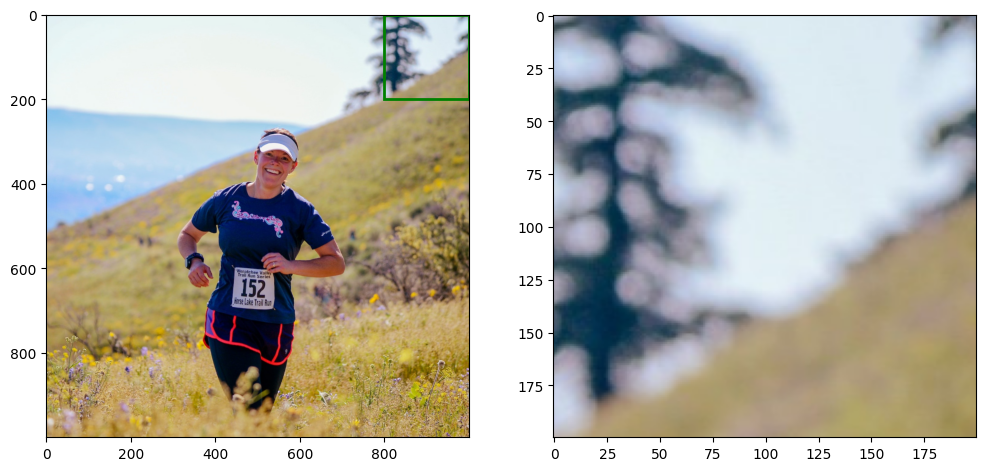

...

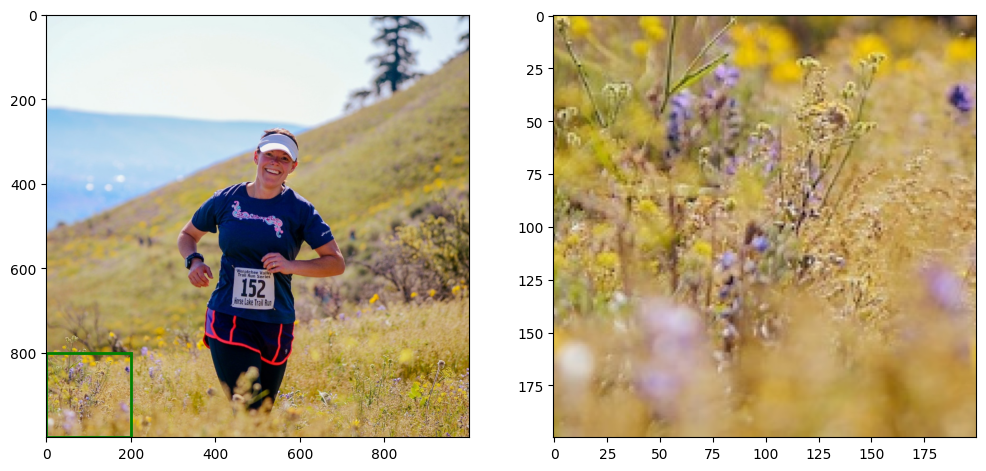

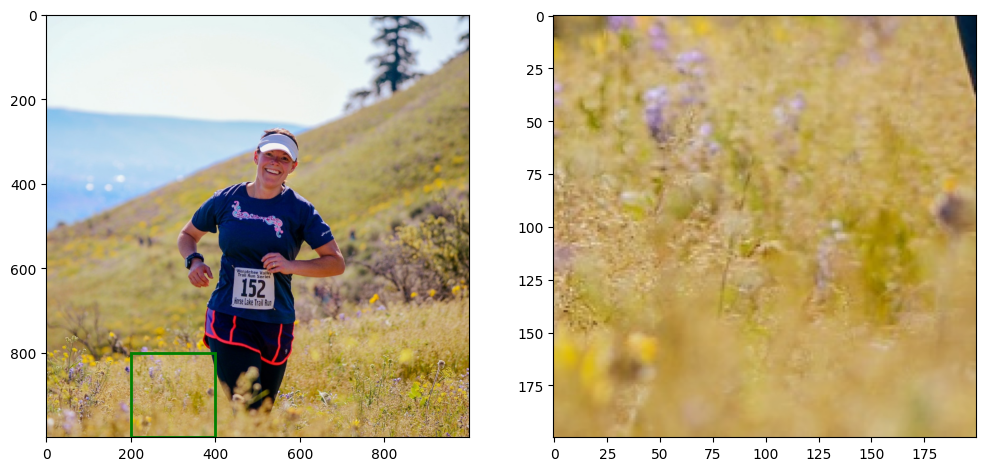

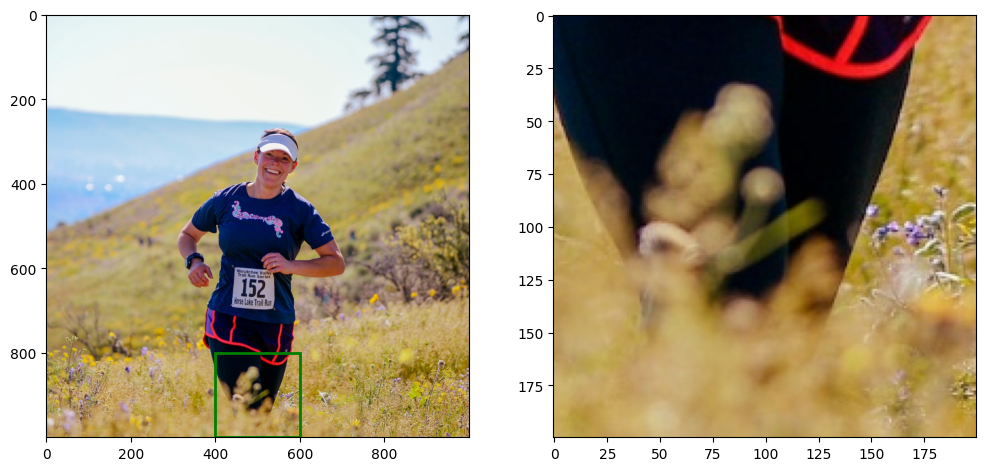

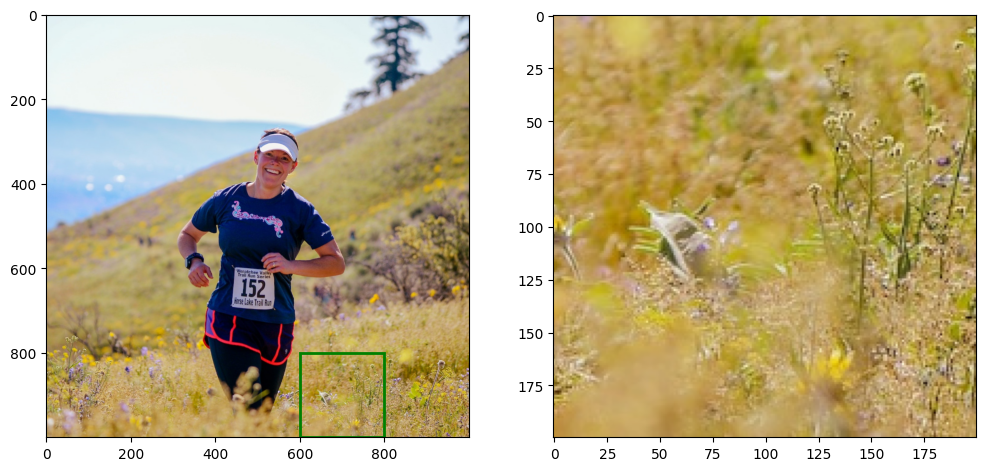

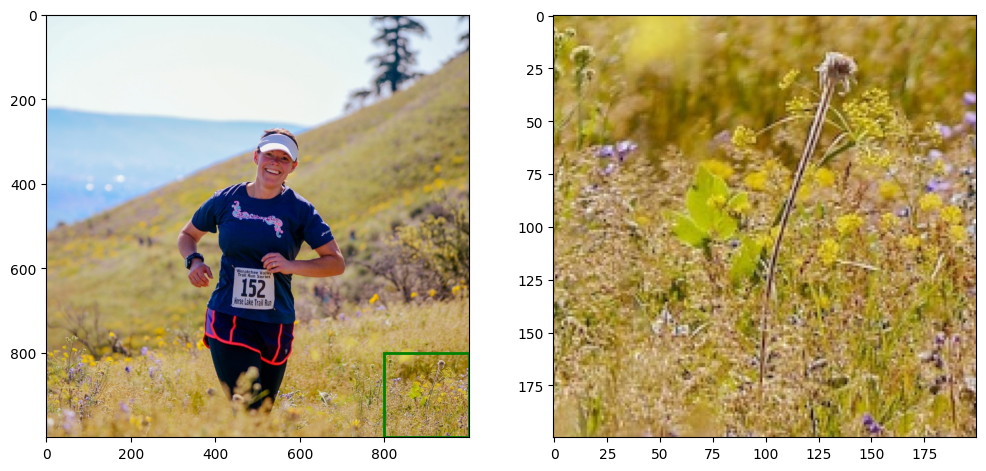

In [7]:
for x, window in enumerate(windows):
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))
  axarr[0].imshow(np_image)
  rect = patches.Rectangle((window[0], window[1]), 200, 200, linewidth=2, edgecolor='g', facecolor='none')
  axarr[0].add_patch(rect)
  axarr[1].imshow(window[2])
  f.savefig('sliding_window/'+str(x)+'.png', dpi=f.dpi)

## 1.6 Crear video

In [8]:
image_folder = 'sliding_window'
video_name = 'video.avi'

images = [img for img in os.listdir(image_folder) if img.endswith('.png')]

In [9]:
images = sorted(images, key=lambda x: int(os.path.splitext(x)[0]))

In [10]:
frame = cv2.imread(os.path.join(image_folder, images[0]))

In [11]:
height, width, layer = frame.shape

In [12]:
video = cv2.VideoWriter(video_name, 0, 1, (width, height))

In [13]:
for image in images:
  video.write(cv2.imread(os.path.join(image_folder, image)))
video.release()

# 2.Trabajando con métricas de object detection

## 2.1 import numpy

In [14]:
import numpy as np

2.2 Definir BBox

Calcular el IoV

Interseccion del area
prediccion area de bbox


In [15]:
def bb_intersection_over_union(ground_truth_bbox, predicted_bbox):
  xA = max(ground_truth_bbox[0], predicted_bbox[0])
  yA = max(ground_truth_bbox[1], predicted_bbox[1])
  xB = min(ground_truth_bbox[2], predicted_bbox[2])
  yB = min(ground_truth_bbox[3], predicted_bbox[3])

  intersection_area = max(0, xB-xA + 1) * max(0, yB-yA + 1)

  ground_truth_bbox_area = (ground_truth_bbox[2] - ground_truth_bbox[0] + 1) * (ground_truth_bbox[3] - ground_truth_bbox[1] + 1)
  predicted_bbox_area = (predicted_bbox[2] - predicted_bbox[0] + 1) * (predicted_bbox[3] - predicted_bbox[1] + 1)

  iou = intersection_area / float(ground_truth_bbox_area + predicted_bbox_area - intersection_area)

  return iou

In [16]:
image = cv2.imread('pexels-frank-cone-2330502-cropped.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [17]:
example = ([1400, 850, 1650, 1100], [1400, 850, 1600, 1100])

In [18]:
iou = bb_intersection_over_union(example[0], example[1])

In [19]:
print('Valor IoU ' + str(iou))

Valor IoU 0.8007968127490039


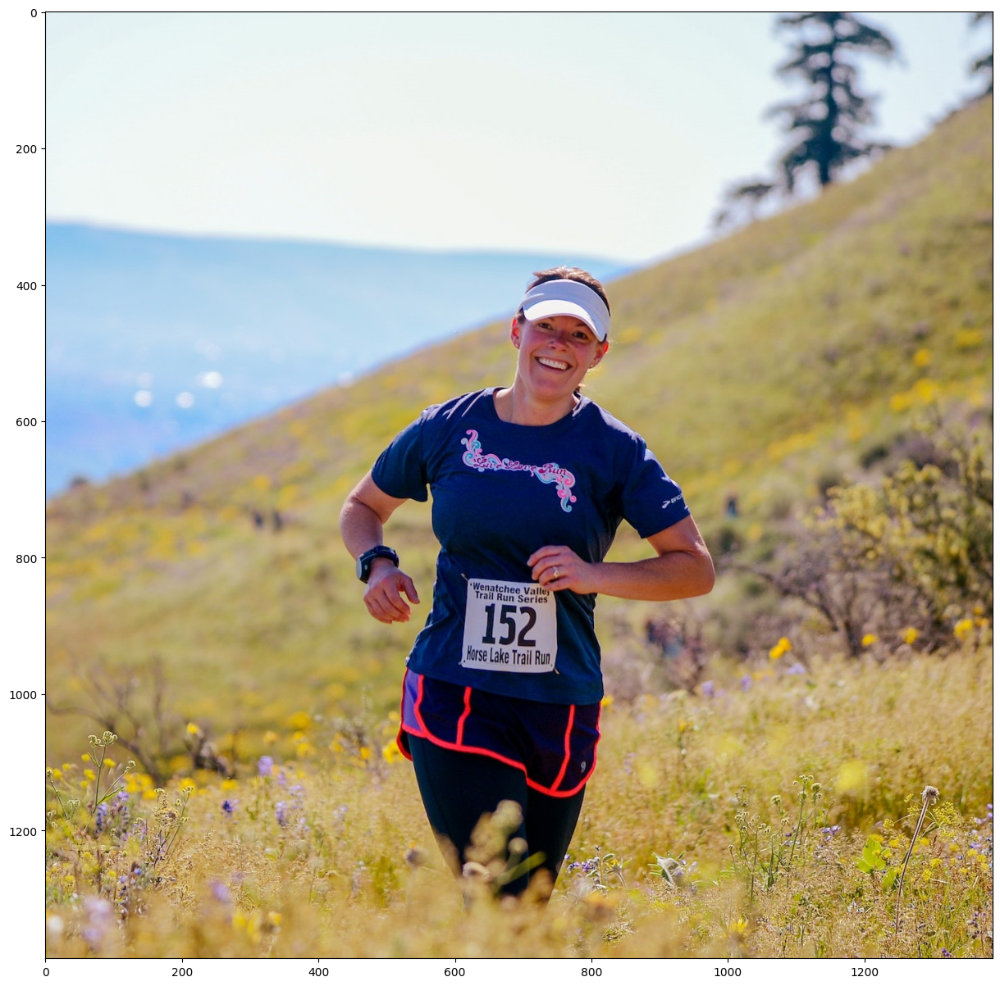

In [21]:
fig, ax = plt.subplots(figsize=(15, 15))

ax.imshow(image)
rect = patches.Rectangle(tuple(example[0][:2]), example[0][2]-example[0][0], example[0][3]-example[0][1], linewidth=3, edgecolor='g', facecolor='none')
ax.add_patch(rect)

rect = patches.Rectangle(tuple(example[1][:2]), example[1][2]-example[1][0], example[1][3]-example[1][1], linewidth=3, edgecolor='r', facecolor='none')
ax.add_patch(rect)

plt.show()
